![neo](./image/neo.png)

## Дипломная работа по теме:
   ### "Построение и обучение условной генеративной состязательной сети (cGAN) для задач трансляции изображений."
    
   #### Преподаватель: НАТАЛЬЯ БАДАНИНА
   #### Студент: КОНСТАНТИН ТОМИЛОВ

#### Практическое применение:
##### Преобразование изображения в изображение с помощью условных состязательных сетей можно применять для широкого круга задач, включая:
   - синтез фотографий из карт меток;
   - создание раскрашенных фотографий из черно-белых изображений;
   - преобразование фотографий Google Maps в аэрофотоснимки;
   - преобразование эскизов в фотографии.

### Цель работы:
Построить и обучить условную генеративно-состязательную сеть (cGAN),
которая изучает сопоставление входных изображений и с выходными изображениями на примере датасета "Сityscapes" 
и генерирует изображения городских улиц на основе масок сегментации.

### Методы и средства:
#### Фреймворки и библиотеки: TensorFlow, Keras, Python
#### Датасет "Сityscapes" (kaggle.com/dansbecker/cityscapes-image-pairs):
    Набор создан исследовательской группой Berkeley AI Research.
    Данные Cityscapes содержат помеченные изображения, снятые из автомобилей в Германии.
    Набор данных содержит 2975 файлов обучающих изображений (train) и 500 файлов проверочных изображений (val).   
    Каждый файл изображения имеет размер 256x512 пикселей, и каждый файл представляет собой композицию, 
    в которой исходная фотография находится в левой половине изображения, 
    а изображение с меткой (результат семантической сегментации) — в правой половине. 
    
### Архитектура сети:
1. Генератор с архитектурой на базе нейросети U-Net .
2. Дискриминатор, представленный свёрточным классификатором PatchGAN.


#### 1. Импорт библиотек

In [1]:
import tensorflow as tf
import tensorboard
from tensorflow import keras

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
import matplotlib.image as mpimg
from IPython import display

from glob import glob


# import warnings
# warnings.filterwarnings('ignore')


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [2]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    raise SystemError('GPU device not found')

In [3]:
print(tf.test.is_built_with_cuda())

True


In [ ]:
!cat /proc/version
!cat /proc/cpuinfo
!cat /proc/meminfo

#### 2. Подготовка данных

##### 2.1. Загрузка тренировочного набора train и проверочного набора validation

In [2]:
train_img_paths = glob('drive/MyDrive/data/cityscapes/train/*jpg')
val_img_paths = glob('drive/MyDrive/data/cityscapes/val/*jpg')
len(train_img_paths), len(val_img_paths)

(2975, 500)

* Каждое исходное изображение имеет размер 256 x 512 и содержит два изображения размером 256 x 256

In [3]:
sample_image = tf.io.read_file(train_img_paths[0])
sample_image = tf.io.decode_jpeg(sample_image)
# sample_image=tf.image.decode_jpeg(sample_image)
sample_image.shape

TensorShape([256, 512, 3])

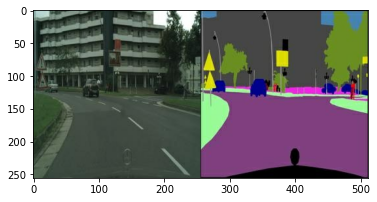

In [4]:
plt.figure()
plt.imshow(sample_image)

##### 2.2. Отделим реальные изображения улиц от их масок изображений — все они будут иметь размер 256 x 256 .

##### 2.2.1. Определим функцию, которая загружает файлы изображений и выводит два тензора изображений:

In [10]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
    image = tf.io.read_file(image_file)
    image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real image
  # - one with an label image 
    w = tf.shape(image)[1]
    w = w // 2
    input_image = image[:, w:, :]
    real_image = image[:, :w, :]

  # Convert both images to float32 tensors
    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image

##### 2.2.2. Построим образец входного (изображение маски) и реального (фото улицы) изображения:

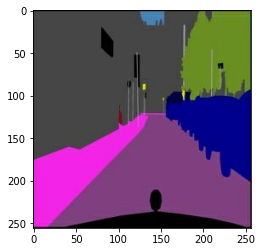

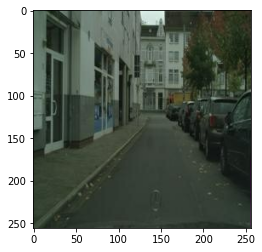

In [11]:
inp, re = load(str(train_img_paths[1]))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

##### 2.3. Применим методы обработки Random jittering (случайное дрожание) и Mirroring (зеркальное отображение) для предварительной обработки обучающего набора:

##### Для этого определим несколько функций:

##### * Изменение размера каждого изображения 256 x 256 на большую высоту и ширину — 286 x 286 .
##### * Произвольная обрезка изображения обратно до 256 x 256 .
##### * Произвольное отражение изображения по горизонтали, т.е. слева направо (случайное зеркальное отображение).
##### * Нормализация изображения в диапазоне [-1, 1] .

In [12]:
# The training set consist of len(test_img_paths) images
BUFFER_SIZE = len(test_img_paths)
# The batch size for the U-Net
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [13]:
def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

In [14]:
def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])
    
    return cropped_image[0], cropped_image[1]

In [15]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

In [16]:
@tf.function(tf.autograph.set_verbosity(0))
def random_jitter(input_image, real_image):
  # Resizing to 286x286
    input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
    input_image, real_image = random_crop(input_image, real_image)

    if tf.random.uniform(()) > 0.5:
    # Random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

* Проверим часть предварительно обработанного вывода

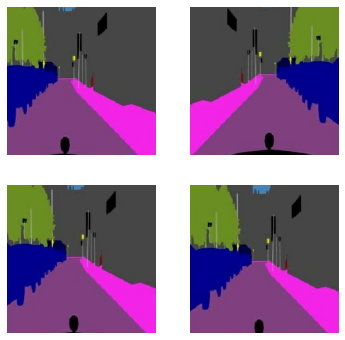

In [17]:
plt.figure(figsize=(6, 6))
for i in range(4):
    rj_inp, rj_re = random_jitter(inp, re)
    plt.subplot(2, 2, i + 1)
    plt.imshow(rj_inp / 255.0)
    plt.axis('off')
plt.show()

##### 2.4. Определим функции, которые загружают и предварительно обрабатывают обучающий и тестовый наборы:

In [18]:
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

In [19]:
def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

#### 3. Создание конвейера ввода данных с помощью `tf.data`

In [20]:
train_dataset = tf.data.Dataset.list_files(train_img_paths)
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [21]:
try:
    test_dataset = tf.data.Dataset.list_files(test_img_paths)
except tf.errors.InvalidArgumentError:
    test_dataset = tf.data.Dataset.list_files(val_img_paths)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

#### 4. Построение Генератора
Генератор cGAN представляет собой модифицированный U-Net.
U-Net состоит из кодера (понижающего дискретизатора) и декодера (апсемплера).
- Каждый блок энкодера: Convolution -> Batch normalization -> Leaky ReLU
- Каждый блок декодера: Transposed convolution -> Batch normalization -> Dropout (применяется к первым трём блокам) -> ReLU
- Между энкодером и декодером пропускное соединение (skip connections) (аналогично U-Net).

##### 4.1. Построение понижающего дискретизатора (downsampler) (encoder)

In [22]:
OUTPUT_CHANNELS = 3

In [23]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

In [24]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


 ##### 4.2. Построение повышающего дискретизатора (upsampler) (decoder):

In [25]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

In [26]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


##### 4.3. Построим генератор с понижающим дискретизатором и повышающим дискретизатором:

In [27]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
        downsample(128, 4),  # (batch_size, 64, 64, 128)
        downsample(256, 4),  # (batch_size, 32, 32, 256)
        downsample(512, 4),  # (batch_size, 16, 16, 512)
        downsample(512, 4),  # (batch_size, 8, 8, 512)
        downsample(512, 4),  # (batch_size, 4, 4, 512)
        downsample(512, 4),  # (batch_size, 2, 2, 512)
        downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
         upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
         upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
         upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
         upsample(512, 4),  # (batch_size, 16, 16, 1024)
         upsample(256, 4),  # (batch_size, 32, 32, 512)
         upsample(128, 4),  # (batch_size, 64, 64, 256)
         upsample(64, 4),  # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

##### 4.4. Визуализируем архитектуру Модели Генератора:

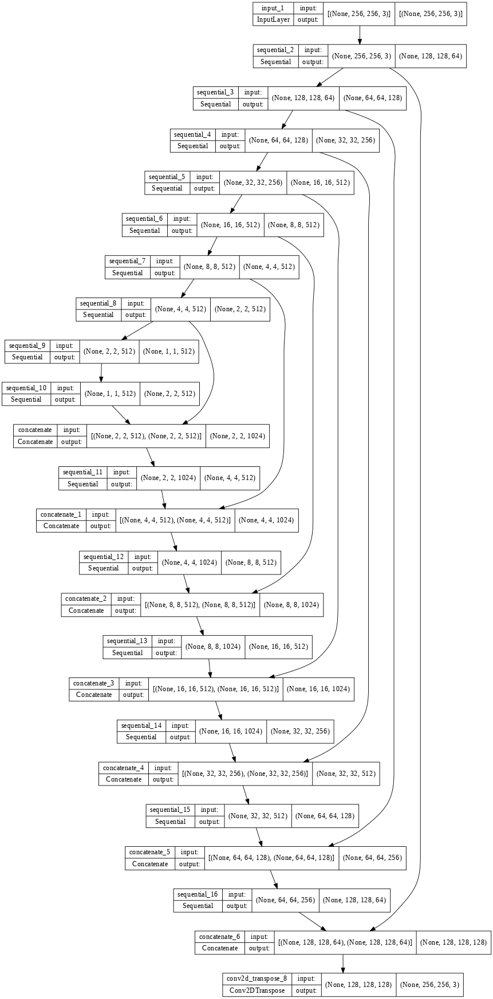

In [28]:
generator = Generator()
tf.keras.utils.plot_model(generator, "Generator_model.png", show_shapes=True, dpi=64)

##### 4.5. Протестируем генератор:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


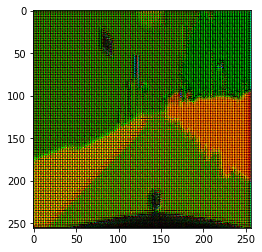

In [29]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

##### 4.6. Определим функцию потерь генератора

cGAN изучают структурированные потери,
которые наказывают возможную структуру,
которая отличается от вывода сети и целевого изображения.

Функция потерь генератора представляет собой сигмовидную кросс-энтропийную потерю сгенерированных изображений и массива из них, 
а также потерю L1, которая представляет собой MAE (средняя абсолютная ошибка) между сгенерированным изображением и целевым изображением.
Это позволяет сгенерированному изображению стать структурно похожим на целевое изображение.

Формула для расчета общих потерь генератора: gan_loss + LAMBDA * L1_loss , где LAMBDA = 100 .

In [30]:
LAMBDA = 100

In [31]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [32]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

* Процедура обучения генератора выглядит следующим образом:

<function matplotlib.pyplot.show(close=None, block=None)>

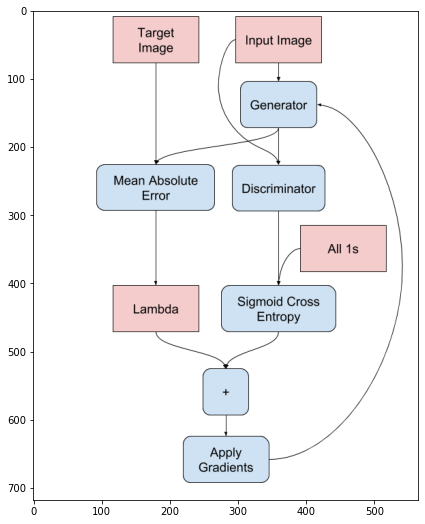

In [3]:
dis_im = mpimg.imread('image/gen.png')
plt.figure(figsize=(15, 9))
plt.imshow(dis_im)
plt.show

#### 5. Построение Дискриминатора
##### Дискриминатор представляет собой сверточный классификатор PatchGAN — он пытается классифицировать, является ли каждый фрагмент изображения реальным или нет.

- Каждый блок в дискриминаторе: Convolution -> Batch normalization -> Leaky ReLU.
- Форма вывода после последнего слоя (batch_size, 30, 30, 1) .
- Каждый фрагмент выходного изображения 30 x 30 классифицирует часть входного изображения размером 70 x 70.
##### Дискриминатор получает 2 входа:
- Входное изображение и целевое изображение, которое следует классифицировать как реальное.
- Входное изображение и сгенерированное изображение (выход генератора), которое он должен классифицировать как подделку.
- Для объединения входов вместе используется tf.concat([inp, tar], axis=-1).

##### 5.1. Построим дискриминатор:

In [39]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

##### 5.2. Визуализируем архитектуру модели дискриминатора:

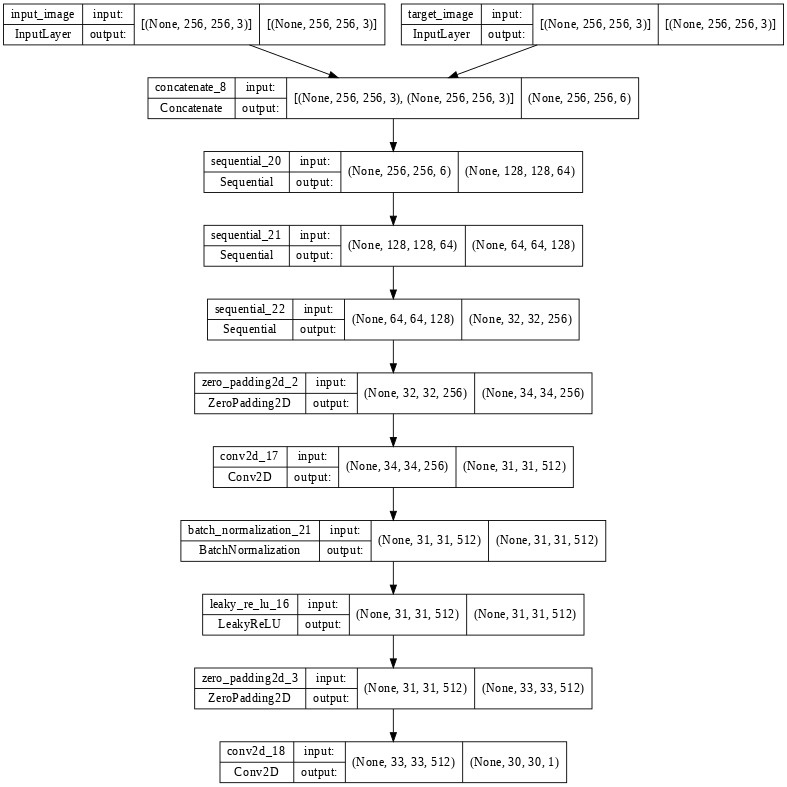

In [40]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, "Discriminator_model.png", show_shapes=True, dpi=64)

##### 5.3. Тест дискриминатора:

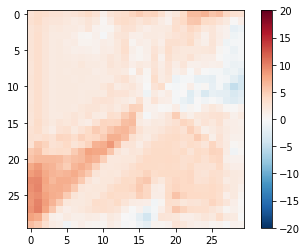

In [41]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

##### 5.4. Определим функцию потерь дискриминатора
Функция discriminator_loss принимает 2 входа: реальные изображения и сгенерированные изображения.
* real_loss — это сигмовидная кросс-энтропийная потеря реальных изображений и массива единиц (поскольку это настоящие изображения) .
* generated_loss — это сигмовидная кросс-энтропийная потеря сгенерированных изображений и массива нулей (поскольку это поддельные изображения) .
* total_loss — это сумма real_loss и generated_loss .

In [42]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

* Процедура обучения дискриминатора выглядит следующим образом:

<function matplotlib.pyplot.show(close=None, block=None)>

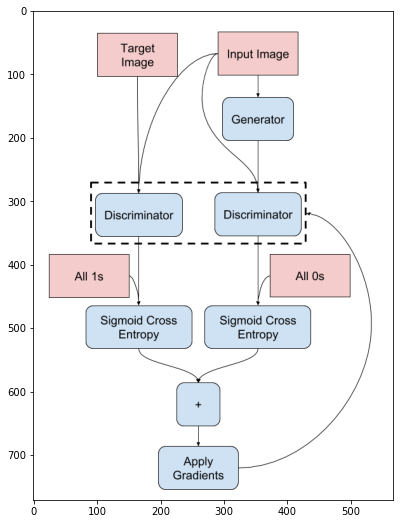

In [4]:
dis_im = mpimg.imread('image/dis.png')
plt.figure(figsize=(15, 9))
plt.imshow(dis_im)
plt.show


#### 6. Определим функции оптимизации и сохранения контрольных точек


In [44]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [45]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

#### 7. Генерация изображений
##### 7.1. Определим функцию для построения изображений во время обучения.

- Передача изображения из тестового набора в генератор.
- Генератор преобразует входное изображение в выходное.
- Построение предсказаний


In [46]:
def generate_images(model, test_input, tar):
    # training=True, так как нужна пакетная статистика при запуске модели на тестовом наборе данных.
    # Если training=False , получается накопленная статистика, полученную из набора обучающих данных.
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

##### 7.2. Протестируем функцию

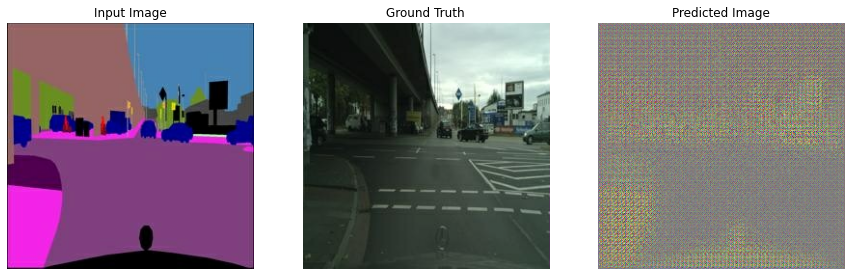

In [47]:
for example_input, example_target in test_dataset.take(1):
    generate_images(generator, example_input, example_target)

#### 8. Обучение модели
 ##### 8.1. Для каждого входного образца генерируется выходное изображение.
 - Дискриминатор получает input_image и сгенерированное изображение в качестве первого входа.
 - Второй вход — это input_image и target_image.
 - Вычисляются потери генератора и дискриминатора.
 - Вычисляются градиенты потерь для генератора, переменных (входных данных) дискриминатора и обработка их оптимизатором.
 - Отражение потерь посредством TensorBoard.

In [2]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [49]:
@tf.function(tf.autograph.set_verbosity(0))
def train_step(input_image, target, step):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
        tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

##### 8.2. Тренировочный цикл.
- Итерации по количеству шагов.
- Через каждые 10 шагов выводится точка ( . ).
- Каждые 1000 шагов: очистка дисплея и запуск generate_images , чтобы показать прогресс.
- Каждые 5к шагов: сохранение контрольной точки.

In [50]:
def fit(train_ds, test_ds, steps):
    example_input, example_target = next(iter(test_ds.take(1)))
    start = time.time()

    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:
            display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()

            generate_images(generator, example_input, example_target)
            print(f"Step: {step//1000}k")

        train_step(input_image, target, step)

        # Training step
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)


        # Save (checkpoint) the model every 5k steps
        if (step + 1) % 5000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

##### 8.3. Этот цикл обучения сохраняет журналы в TensorBoard, чтобы отслеживать ход обучения.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}
# %reload_ext tensorboard
# !kill 13944

##### 8.4. Обучающий цикл:

Time taken for 1000 steps: 96.04 sec



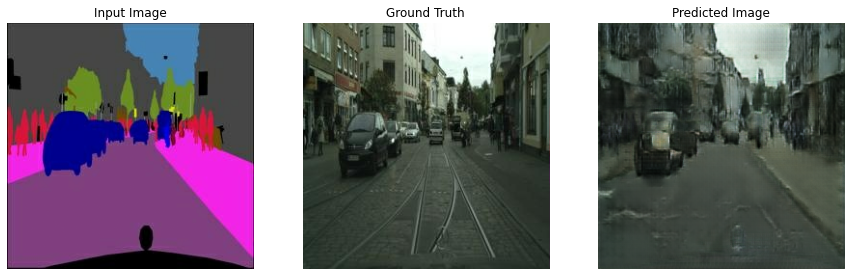

Step: 39k
....................................................................................................

In [53]:
model = fit(train_dataset, test_dataset, steps=40000) # 40000

#### 9. Восстановление последней контрольной точки и тест сети

In [54]:
!ls {checkpoint_dir}

checkpoint		    ckpt-5.data-00000-of-00001
ckpt-1.data-00000-of-00001  ckpt-5.index
ckpt-1.index		    ckpt-6.data-00000-of-00001
ckpt-2.data-00000-of-00001  ckpt-6.index
ckpt-2.index		    ckpt-7.data-00000-of-00001
ckpt-3.data-00000-of-00001  ckpt-7.index
ckpt-3.index		    ckpt-8.data-00000-of-00001
ckpt-4.data-00000-of-00001  ckpt-8.index
ckpt-4.index


In [55]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

#### 10. Сгенерируем несколько изображений, используя тестовый набор данных

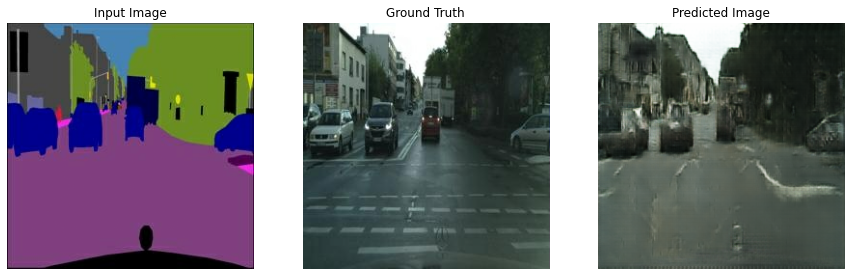

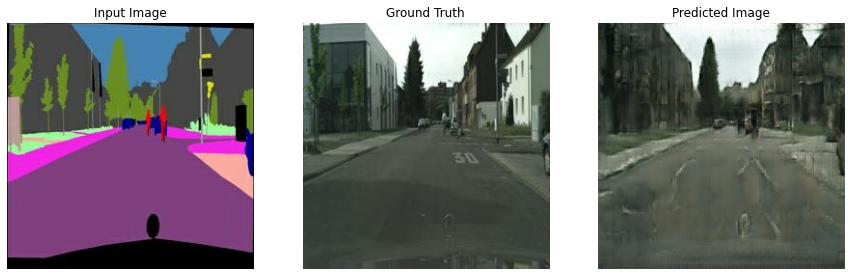

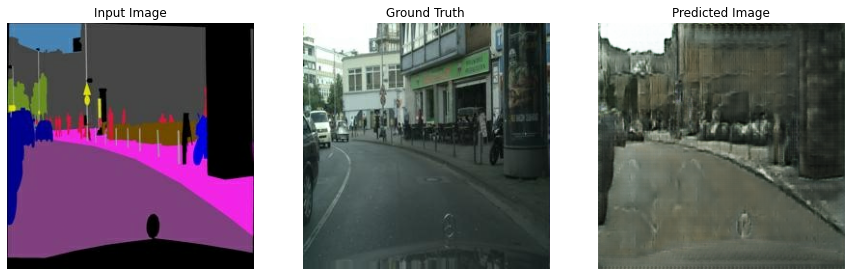

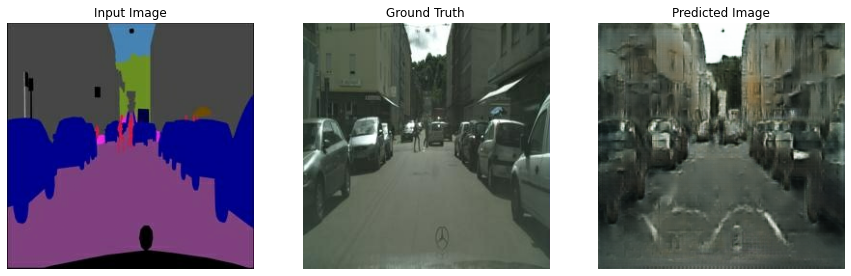

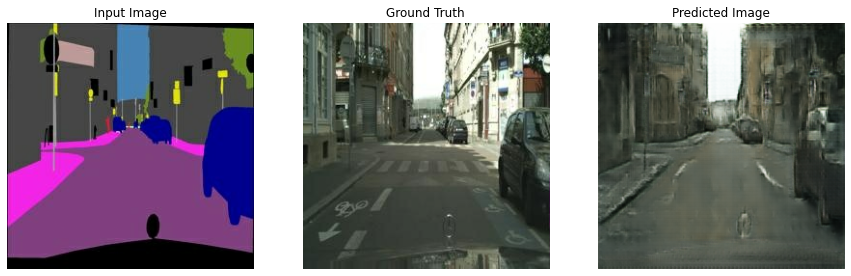

In [56]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
    generate_images(generator, inp, tar)

#### 11.0. Интерпретация метрик оценки и выводы:

Цель: убедиться, что ни модель генератора, ни модель дискриминатора не «выиграли». 
- Значение ln(2) = 0.69 является хорошим показателем потерь, поскольку указывает, что дискриминатор в среднем одинаково неуверен в двух вариантах.


<function matplotlib.pyplot.show(close=None, block=None)>

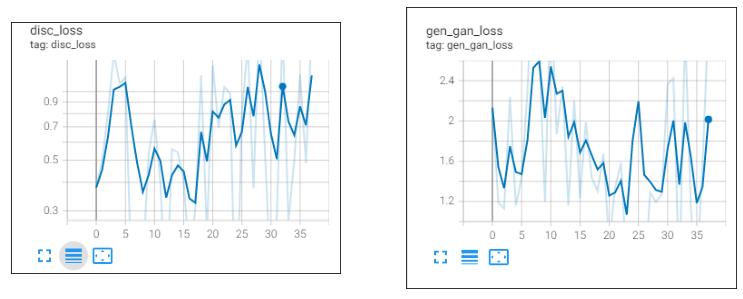

In [5]:
disc_loss = mpimg.imread('image/disc_loss.png')
gen_gan_loss = mpimg.imread('image/gen_gan_loss.png')
fig, axes = plt.subplots(1,2, figsize=(13, 6))
axes[0].set_xticks([])
axes[0].set_yticks([])
axes[1].set_xticks([])
axes[1].set_yticks([])
axes[0].imshow(disc_loss)
axes[1].imshow(gen_gan_loss)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

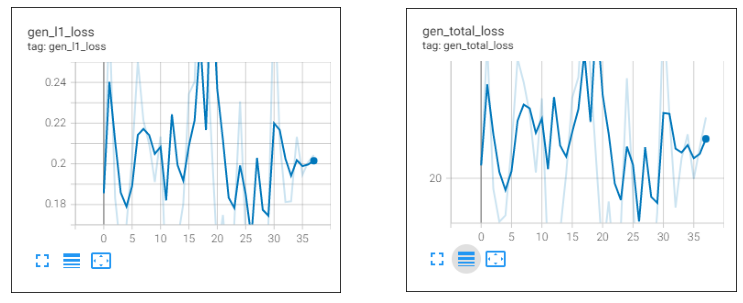

In [6]:
gen_l1_loss = mpimg.imread('image/gen_l1_loss.png')
gen_total_loss = mpimg.imread('image/gen_total_loss.png')
fig, axes = plt.subplots(1,2, figsize=(13, 6))
axes[0].set_xticks([])
axes[0].set_yticks([])
axes[1].set_xticks([])
axes[1].set_yticks([])
axes[0].imshow(gen_l1_loss)
axes[1].imshow(gen_total_loss)
plt.show

#### Выводы:
   ##### 1. gen_gan_loss или disc_loss не становятся слишком низкими, что указывает на то, что ни одна из моделей не доминирует над другой.
   ##### Комбинированная модель обучается успешно.        
   ##### 2. По мере обучения gen_l1_loss и gen_total_loss уменьшаются.
   ##### 3. В среднем disc_loss < 0.69 или близок к нему -  дискриминатор работает лучше, чем случайный, в комбинированном наборе реальных и сгенерированных изображений.
    
   ##### 4. gen_gan_loss > 0.69 означает, что генератор хуже, чем случайный, обманывает дискриминатор.
   ##### 5. Необходимо дообучить модель генератора увеличив кол-во шагов или изменить размер Batch.